<h1>Лабораторна робота #7</h1>
<h2>Сценарії обробки багатоспектральних супутникових зображень</h2>
<h3>Виконав: Воронюк Володимир ФБ-24</h3>

<p>
  <b>Мета роботи:</b> ознайомитися з основними принципами обробки даних
  дистанційного зондування Землі (ДЗЗ) та можливостями мови Python для
  обробки геопросторової інформації, а саме, багатоспектральних
  супутникових зображень засобами бібліотеки абстракції супутникової
  інформації (GDAL).
</p>
<p>
  <b>Основні поняття:</b> дані ДЗЗ (remote sensing data), супутникові зображення
  (satellite imagery), обробка зображень (image processing).
</p>

<h4>Постановка задачі</h4>

<p>
  Лабораторна робота має дві частини. У першій (простішій) частині (пп. 1–
  2) необхідно працювати з даними Sentinel-2, які необхідно завантажити за
  допомогою Copernicus Scihub за ідентифікаторами (список ідентифікаторів
  дивись нижче) або скористатися архівом, що надається викладачем. У
  другій (складнішій) частині (п. 4) потрібно також самостійно завантажити
  дані Landsat з порталу USGS. Для цього підійдуть будь які 2 сусідніх знімки
  Ladsat-8 з відсотком хмарності до 30%, (рекомендовані ідентифікатори
  наведено внизу у п. 3).
</p>

<p>
  1. Завантажити необхідні дані Sentinel-2 (або з Copernicus SciHub, або з
  Google-диска). За допомогою бібліотеки sentinelhub написати скрипт для
  завантаження супутникових знімків Sentinel-2, які покривають Київ (ROI —
  POLYGON((29.073321247506765 49.845775018245774,31.986007792928522
  49.845775018245774,31.986007792928522 51.278667808079206,29.073321247506765
  51.278667808079206,29.073321247506765 49.845775018245774)))
</p>
<p>
  Список ідентифікаторів Sentinel-2:
</p>
<ul>
  <li>
    S2A_MSIL2A_20190821T085601_N0213_R007_T36UUB_20190821T115206
  </li>
  <li>
    S2A_MSIL2A_20190821T085601_N0213_R007_T36UUA_20190821T11
    5206
  </li>
</ul>

In [7]:
from sentinelhub.aws.request import download_safe_format
from glob import glob
import os
import subprocess
from osgeo import gdal
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

/usr/lib/python3.10/abc.py:106: SHDeprecationWarning: AWS functionality will remain in the codebase for now, but won't be actively maintained.
  cls = super().__new__(mcls, name, bases, namespace, **kwargs)


In [8]:
data_dirpath = "./Data"
pred_data_dir = "PreparedData"

In [9]:
class SentinelData:
    TIFF_EXT = ['.tif', '.tiff']
    REPROJ_CONST = "_R4326"

    def __init__(self, product_ids: list, data_dirpath: str):
        self.prod_ids = product_ids
        self.dirpath = data_dirpath
        self.sent_data_dirpath = None
        self.prep_data_dirpath = None

        self.prep_datafile_pathes = []
        self.reproj_into_4326_datafile_pathes = []

    # Розпакування наборів архівів з продуктами ДЗЗ в новостворені папки,
    # назви яких відповідатимуть ідентифікаторам зображень.
    def DownloadData(self):
        if not os.path.isdir(self.dirpath):
            print(f"No such directory: {self.dirpath}")
            return

        self.sent_data_dirpath = os.path.join(
            self.dirpath,
            "SentinelData"
        )

        if not os.path.isdir(self.sent_data_dirpath):
            print(f"Directory {self.sent_data_dirpath} does not exist. Creating")
            os.mkdir(self.sent_data_dirpath)
    

        for product_id in self.prod_ids:
            print(f"Starting to download data: {product_id}")
            download_safe_format(
                product_id=product_id,
                folder=self.sent_data_dirpath,
                entire_product=True,
                redownload=False
            )
            print(f"Data {product_id} loaded")
    
    def GetDataDir(self):
        return self.sent_data_dirpath

    # Конкатенація каналів видимого, ближнього та середнього
    # інфрачервоного спектральних діапазонів (канали 2, 3, 4 та 8) зображення в
    # єдиний GEOTIFF файл.
    
    @staticmethod
    def PrepareDataInDir(source_dir, target_dir):
        if not os.path.isdir(target_dir):
            os.mkdir(target_dir)
        resolutions = [10, 20, 60]

        prep_datafile_pathes = []


        for resolution in resolutions:
            print(f"Preparing image data for resolution: {resolution}")

            img_path = os.path.join(source_dir, f"R{resolution}m")

            #blue channel
            band_2_path = glob(os.path.join(img_path, f"*B02_{resolution}m.jp2"))[0]
            #green channel
            band_3_path = glob(os.path.join(img_path, f"*B03_{resolution}m.jp2"))[0]
            #red channel
            band_4_path = glob(os.path.join(img_path, f"*B04_{resolution}m.jp2"))[0]
            #near infrared channel
            band_8_path = glob(os.path.join(img_path, f"*_*_B*8*_{resolution}m.jp2"))[0]

            bands_path = [
                band_2_path,
                band_3_path,
                band_4_path,
                band_8_path,
            ]

            #path to gdal_merge.py
            gm = "gdal_merge.py"
            output = os.path.join(target_dir, f"output_R{resolution}m.tif")
            prep_datafile_pathes.append(output)

            if os.path.isfile(output):
                continue


            merge_command = [gm, "-separate", "-o", output] + bands_path
            subprocess.run(merge_command)
        
        return prep_datafile_pathes
    

    def PrepareData(self, target_dir):
        data_dir_list = os.listdir(self.sent_data_dirpath)

        if not os.path.isdir(target_dir):
            print(f"Folder {target_dir} does not exist")
            return

        sent_target_dir = os.path.join(target_dir, "SentinelPrepData")
        if not os.path.isdir(sent_target_dir):
            print(f"Directory {sent_target_dir} does no exist. Creating...")
            os.mkdir(sent_target_dir)
        
        self.prep_data_dirpath = sent_target_dir

        for i, data_dir_name in enumerate(data_dir_list):
            sent_dir_path = os.path.join(self.sent_data_dirpath, data_dir_name)
            img_data_path = glob(
                os.path.join(
                    sent_dir_path,
                    '**',
                    'IMG_DATA'
                ),
                recursive=True
            )[0]

            print(f"Preparing data for {sent_dir_path}")
            prep_dir_name = f"Sentinel_{chr(ord('A') + i)}" 

            prep_dir_path = os.path.join(sent_target_dir, prep_dir_name)
            if not os.path.isdir(prep_dir_path):
                print(f"Directory {prep_dir_path} does no exist. Creating...")
                os.mkdir(prep_dir_path)
            
            self.prep_datafile_pathes += SentinelData.PrepareDataInDir(img_data_path, prep_dir_path)
    
    def GetPrepDataDir(self):
        return self.prep_data_dirpath
    
    # @staticmethod
    # def ShowTiffImagesInDir(source_dir, cmap='viridis'):
    #     if not os.path.isdir(source_dir):
    #         print(f"Directory {source_dir} does not exist")
    #         return
        
    #     filenames = os.listdir(source_dir)
    #     for filename in filenames:
    #         if os.path.splitext(filename)[1] not in SentinelData.TIFF_EXT:
    #             continue

    #         img_path = os.path.join(source_dir, filename)
    #         img_fd = rasterio.open(img_path)
    #         print(f"Image display {img_path}")
    #         fig, ax = plt.subplots(figsize=(8, 8))
    #         show(img_fd, [1, 2, 3], ax=ax, cmap=cmap) # Відображення каналів 1, 2, 3
    #         plt.show()
    #         img_fd.close()


    # def ShowTiffImages(self):
    #     prep_sent_data_dirs = os.listdir(self.prep_data_dirpath)

    #     for prep_data_dir_name in prep_sent_data_dirs:
    #         prep_data_dir_path = os.path.join(self.prep_data_dirpath, prep_data_dir_name)
    #         print(f"Image display for directory {prep_data_dir_path}")
    #         SentinelData.ShowTiffImagesInDir(prep_data_dir_path)

    @staticmethod
    def ShowImgForPath(img_path, cmap='viridis'):
        img_fd = rasterio.open(img_path)
        print(f"Image display {img_path}")
        fig, ax = plt.subplots(figsize=(8, 8))
        show(img_fd, [1, 2, 3], ax=ax, cmap=cmap) # Відображення каналів 1, 2, 3
        plt.show()
        img_fd.close()

    
    @staticmethod
    def ShowTiffImgForPathList(img_pathes, cmap='inferno'):
        for img_path in img_pathes:
            SentinelData.ShowImgForPath(img_path, cmap)

    @staticmethod
    def ReprojectRasterInto4326(source_raster, target_raster):
        if os.path.isfile(target_raster):
            return

        gdal.Warp(
            target_raster,
            source_raster,
            dstSRS="EPSG:4326"
        )


    # @staticmethod
    # def ReprojectDirInto4326(source_dir):
    #     if not os.path.isdir(source_dir):
    #         print(f"Directory {source_dir} does not exist")
    #         return

    #     reproj_dir_name = os.path.basename(source_dir) + SentinelData.REPROJ_CONST
    #     reproj_dir_path = os.path.join(os.path.dirname(source_dir), reproj_dir_name)

    #     if not os.path.isdir(reproj_dir_path):
    #         print(f"Directory {reproj_dir_path} does not exist. Creating.")
    #         os.mkdir(reproj_dir_path)

    #     filenames = os.listdir(source_dir)

    #     for filename in filenames:
    #         if os.path.splitext(filename)[1] not in SentinelData.TIFF_EXT:
    #             continue
    #         img_name = filename
    #         img_path = os.path.join(source_dir, filename)
    #         repr_img_name = os.path.splitext(img_name)[0] + SentinelData.REPROJ_CONST + os.path.splitext(img_name)[1]
    #         repr_img_path = os.path.join(reproj_dir_path, repr_img_name)

    #         SentinelData.ReprojectRasterInto4326(img_path, repr_img_path)



    # Перепроектування супутникового зображення у проєкцію 4326.
    def ReprojectInto4326(self):
        for orig_img_path in self.prep_datafile_pathes:
            orig_img_name = os.path.basename(orig_img_path)
            repr_img_name = os.path.splitext(orig_img_name)[0] \
                + SentinelData.REPROJ_CONST\
                + os.path.splitext(orig_img_name)[1]
            repr_img_path = os.path.join(os.path.dirname(orig_img_path), repr_img_name)
            SentinelData.ReprojectRasterInto4326(orig_img_path, repr_img_path)
            self.reproj_into_4326_datafile_pathes.append(repr_img_path)
    
    def GetOrigImgPathes(self):
        return self.prep_datafile_pathes
    
    def GetReprojImgPathes(self):
        return self.reproj_into_4326_datafile_pathes

    #Конкатенація всіх отриманих растрів у один 4-канальний файл TIFF.
    @staticmethod
    def ConcatImagesForPathList(img_pathes, output_path):
        if os.path.isfile(output_path):
            return
        
        gm = "gdal_merge.py"
        merge_command = [gm, "-o", output_path] + img_pathes
        
        subprocess.run(merge_command)
    
    # Конкатенація всіх отриманих растрів у один 4-канальний файл TIFF.
    def ConcatImages(self):
        # concat_orig_output_name = "Concat_Orig_output.tif"
        # concat_orig_output_path = os.path.join(
        #     self.prep_data_dirpath,
        #     concat_orig_output_name
        # )


        # SentinelData.ConcatImagesForPathList(
        #     self.prep_datafile_pathes,
        #     concat_orig_output_path
        # )


        concat_r4326_output_name = "Concat_R4326_output.tif"
        concat_r4326_output_path = os.path.join(
            self.prep_data_dirpath,
            concat_r4326_output_name
        )

        SentinelData.ConcatImagesForPathList(
            self.reproj_into_4326_datafile_pathes,
            concat_r4326_output_path
        )

        return concat_r4326_output_path

    # Обрізання результуючого зображення по заданому векторному контуру.
    @staticmethod
    def CutlineImg(source_img_path, target_img_path, shp_file_path):
        if os.path.isfile(target_img_path):
            return
            
        gdal.Warp(
            target_img_path,
            source_img_path,
            format='GTiff',
            cutlineDSName=shp_file_path,
            cropToCutline=True
        )
 

In [10]:
product_ids = [
    "S2A_MSIL2A_20190821T085601_N0213_R007_T36UUA_20190821T115206",
    "S2A_MSIL2A_20190821T085601_N0213_R007_T36UUB_20190821T115206",
]

sent_data = SentinelData(
    product_ids,
    data_dirpath
)

sent_data.DownloadData()

Starting to download data: S2A_MSIL2A_20190821T085601_N0213_R007_T36UUA_20190821T115206


/home/ethan/ad_labs/ad_pylibs/lib/python3.10/site-packages/sentinelhub/aws/request.py:245: SHDeprecationWarning: AWS functionality will remain in the codebase for now, but won't be actively maintained.
  safe_request = AwsProductRequest(product_id, data_folder=folder, bands=bands, safe_format=True)
/home/ethan/ad_labs/ad_pylibs/lib/python3.10/site-packages/sentinelhub/aws/data.py:353: SHDeprecationWarning: AWS functionality will remain in the codebase for now, but won't be actively maintained.
  client = AwsDownloadClient(config=self.config, boto_params=REQUESTER_PAYS_PARAMS)
/home/ethan/ad_labs/ad_pylibs/lib/python3.10/site-packages/sentinelhub/aws/data.py:612: SHDeprecationWarning: AWS functionality will remain in the codebase for now, but won't be actively maintained.
  client = AwsDownloadClient(config=self.config, boto_params=REQUESTER_PAYS_PARAMS)
/home/ethan/ad_labs/ad_pylibs/lib/python3.10/site-packages/sentinelhub/aws/data_safe.py:331: SHDeprecationWarning: AWS functionality w

Data S2A_MSIL2A_20190821T085601_N0213_R007_T36UUA_20190821T115206 loaded
Starting to download data: S2A_MSIL2A_20190821T085601_N0213_R007_T36UUB_20190821T115206
Data S2A_MSIL2A_20190821T085601_N0213_R007_T36UUB_20190821T115206 loaded


In [11]:
sent_data.PrepareData(pred_data_dir)

Preparing data for ./Data/SentinelData/S2A_MSIL2A_20190821T085601_N0213_R007_T36UUA_20190821T115206.SAFE
Preparing image data for resolution: 10
Preparing image data for resolution: 20
Preparing image data for resolution: 60
Preparing data for ./Data/SentinelData/S2A_MSIL2A_20190821T085601_N0213_R007_T36UUB_20190821T115206.SAFE
Preparing image data for resolution: 10
Preparing image data for resolution: 20
Preparing image data for resolution: 60


Image display PreparedData/SentinelPrepData/Sentinel_A/output_R10m.tif


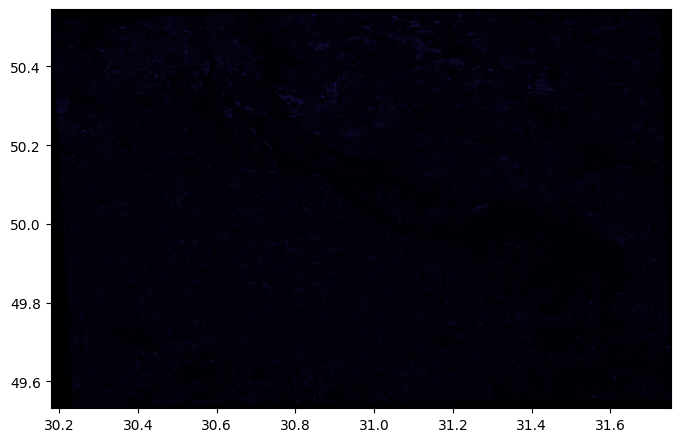

Image display PreparedData/SentinelPrepData/Sentinel_A/output_R20m.tif


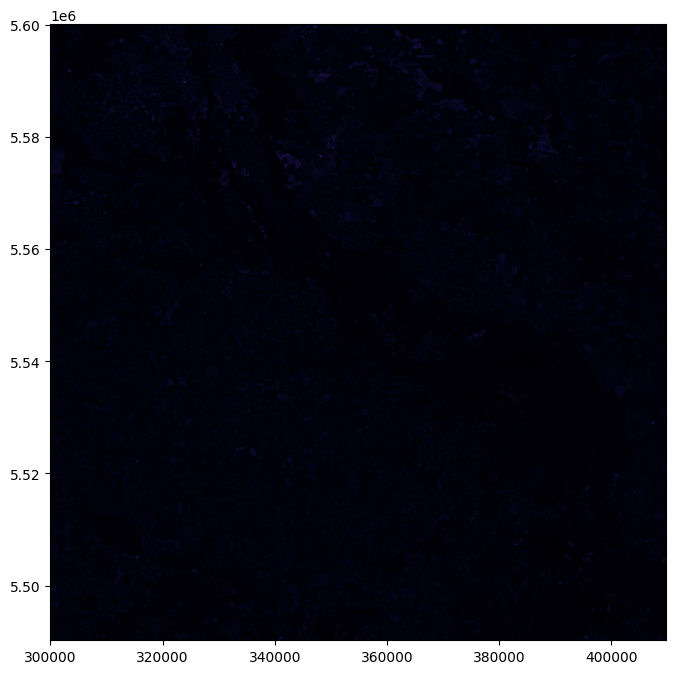

Image display PreparedData/SentinelPrepData/Sentinel_A/output_R60m.tif


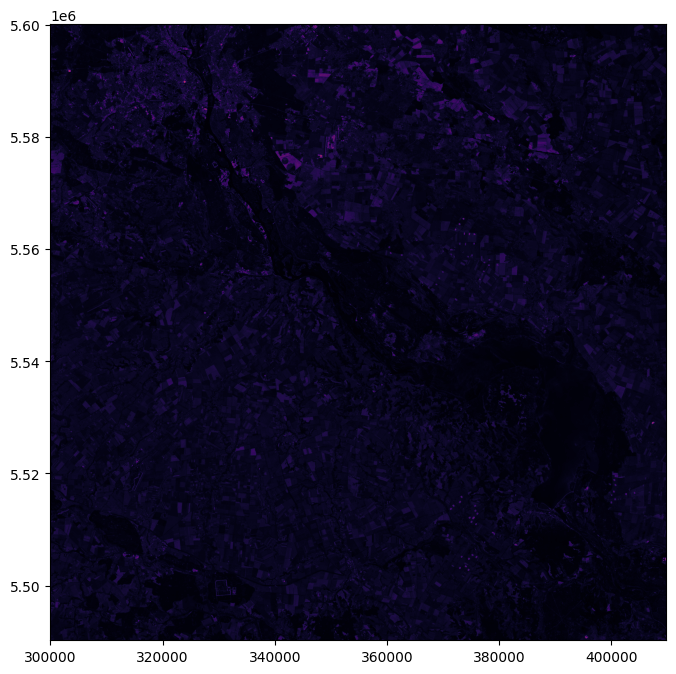

Image display PreparedData/SentinelPrepData/Sentinel_B/output_R10m.tif


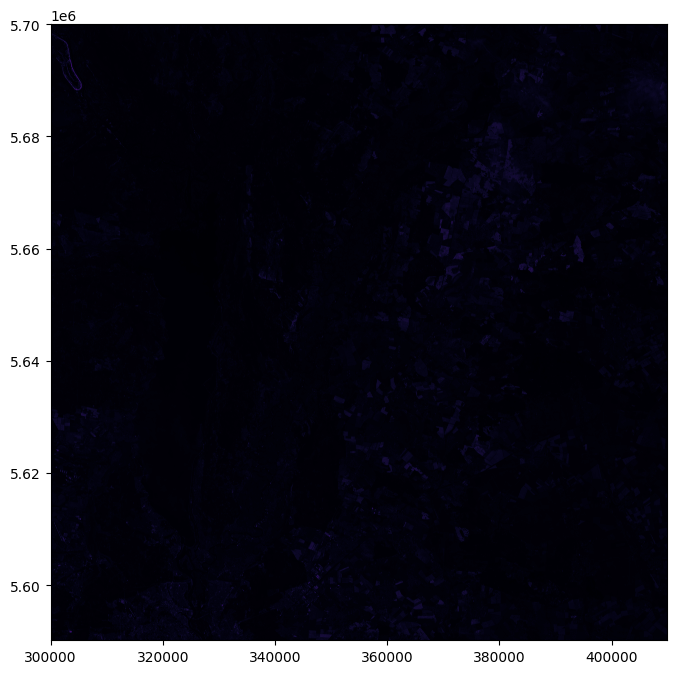

Image display PreparedData/SentinelPrepData/Sentinel_B/output_R20m.tif


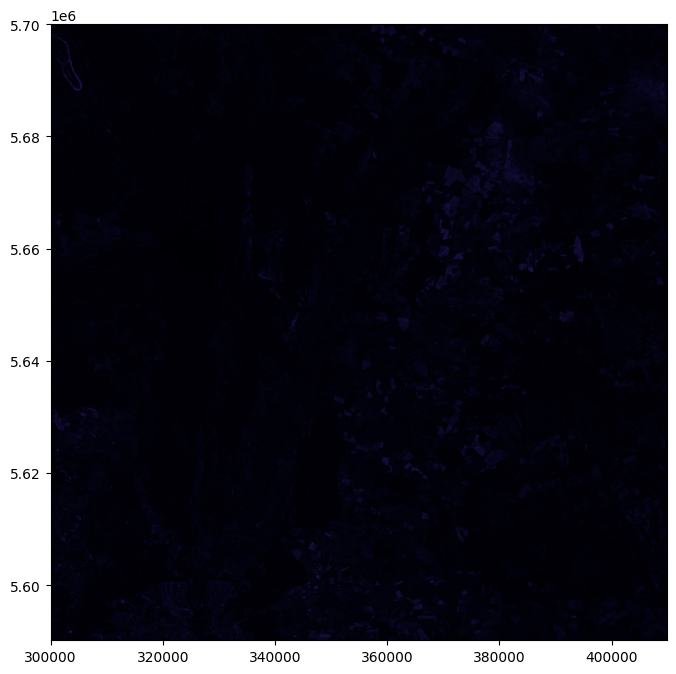

Image display PreparedData/SentinelPrepData/Sentinel_B/output_R60m.tif


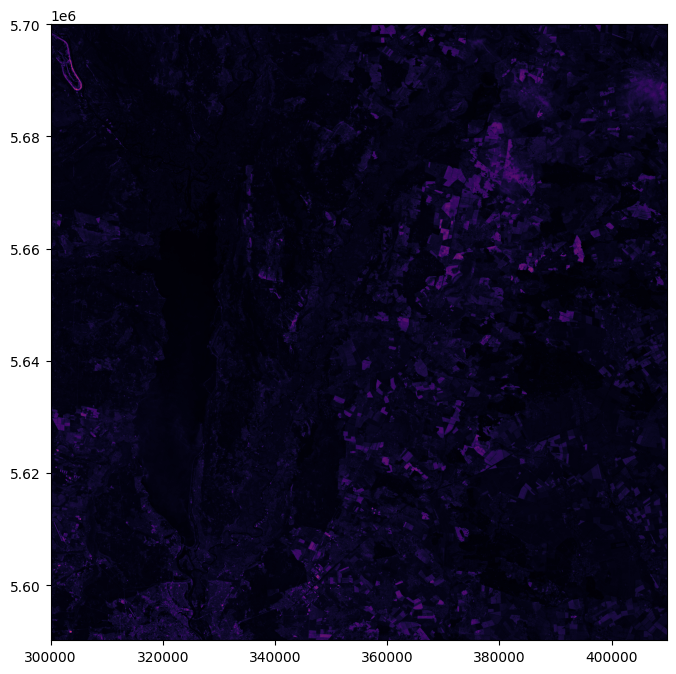

In [12]:
sent_data.ShowTiffImgForPathList(sent_data.GetOrigImgPathes())

In [13]:
sent_data.ReprojectInto4326()

Image display PreparedData/SentinelPrepData/Sentinel_A/output_R10m_R4326.tif


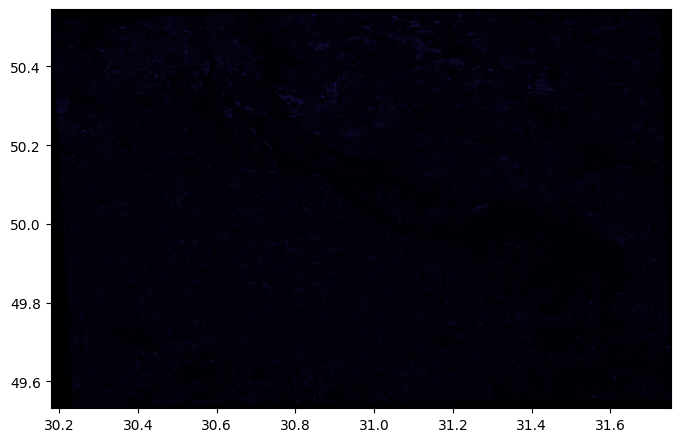

Image display PreparedData/SentinelPrepData/Sentinel_A/output_R20m_R4326.tif


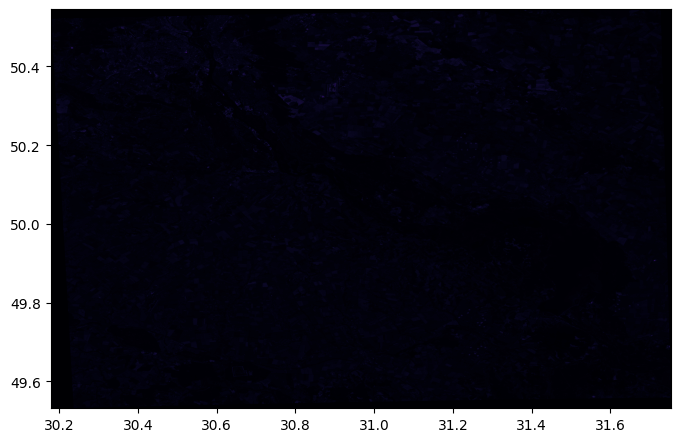

Image display PreparedData/SentinelPrepData/Sentinel_A/output_R60m_R4326.tif


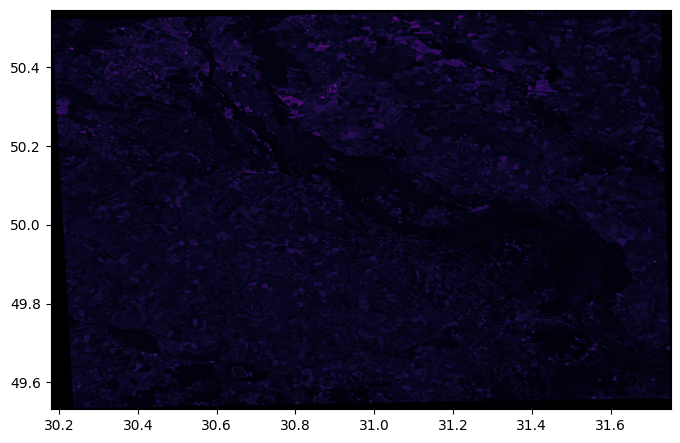

Image display PreparedData/SentinelPrepData/Sentinel_B/output_R10m_R4326.tif


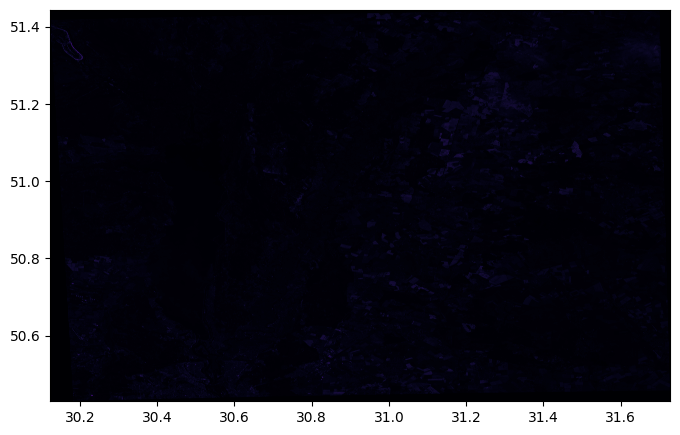

Image display PreparedData/SentinelPrepData/Sentinel_B/output_R20m_R4326.tif


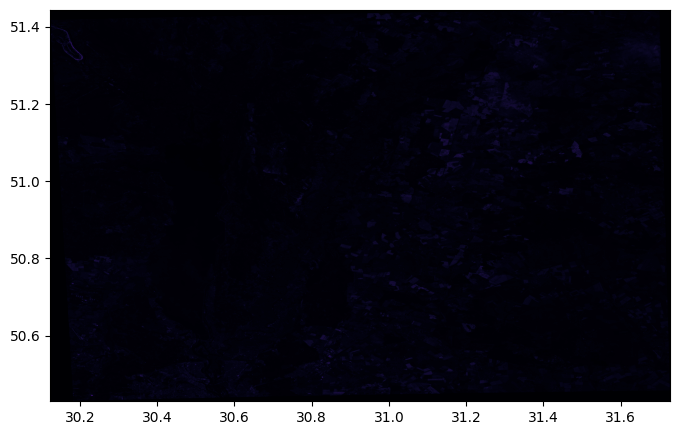

Image display PreparedData/SentinelPrepData/Sentinel_B/output_R60m_R4326.tif


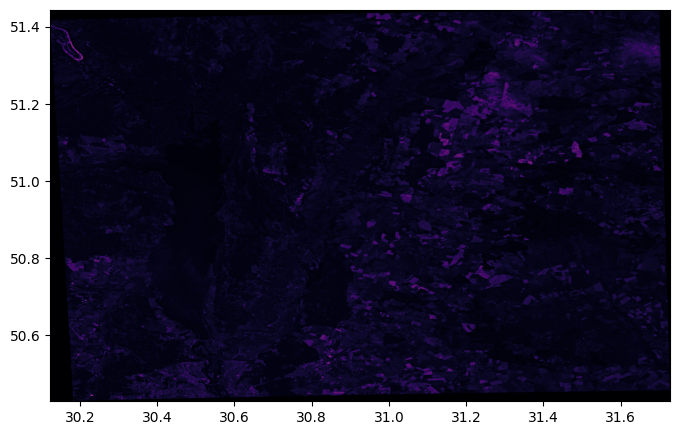

In [14]:
sent_data.ShowTiffImgForPathList(sent_data.GetReprojImgPathes())

In [15]:
concat_reproj_img_path = sent_data.ConcatImages()

Image display PreparedData/SentinelPrepData/Concat_R4326_output.tif


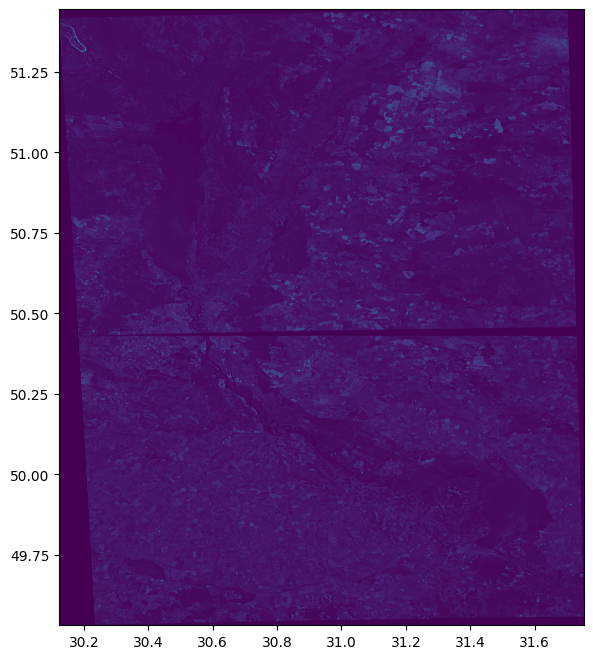

In [16]:
SentinelData.ShowImgForPath(concat_reproj_img_path)

In [17]:
shp_file_path = os.path.join(
    'lab_4_data',
    'Kyiv_regions.shp'
)

crop_output_path = os.path.join(
    sent_data.GetPrepDataDir(),
    'Cropped_output.tif'
)

SentinelData.CutlineImg(
    concat_reproj_img_path,
    crop_output_path,
    shp_file_path
)

Image display PreparedData/SentinelPrepData/Cropped_output.tif


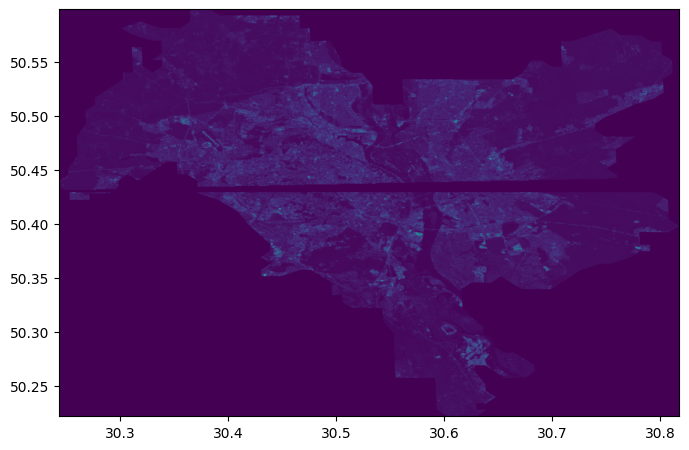

In [18]:
SentinelData.ShowImgForPath(crop_output_path)

<h5> 3. Протестувати різні реалізовані в gdal методи паншарпенінгу. </h5>
<p> 
  Для цього підготуйте склеєні RGB канали Landsat-8 та окремо панхроматичний
  канал.
</p>
<p>
  Переведіть панхроматичний канал у 30 м, а RGB канали у 60 метрів.
</p>
<p>
  Після цього паншарпніть 60 метровий RGB за допомогою 30 м
  панхроматичного каналу.
</p>
<p>
  Після цього ви отримуєте два 30 метрових RGB
  зображення - перший оригінальний, другий паншарпнутий. Підрахуйте
  метрики точності паншарпенінгу (це будь які вам відомі метрики які можна
  використовувати для валідації регресії, наприклад r square). За даними
  метриками виберіть найкращий метод паншарпенінгу.
</p>
</p>
  Список ідентифікаторів Landsat-8:
</p>
<ol>
  <li>
    LC08_L1TP_182025_20190830_20190903_01_T1
  </li>
  <li>
    LC08_L1TP_182026_20190830_20190903_01_T1
  </li>
</ol>

In [19]:
from glob import glob
import os
import subprocess
from osgeo import gdal
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import shutil

import sklearn.metrics

In [20]:
class LandSatData:
    TIFF_EXT = ['.tif', '.tiff']
    REPROJ_CONST = "_R4326"

    def __init__(self, product_ids: list, data_dirpath: str, land_data_dirpath: str = "./Data/LandSatData"):
        self.prod_ids = product_ids
        self.dirpath = data_dirpath
        self.data_dirpath = land_data_dirpath
        self.prep_data_dirpath = None

        self.prep_rgb_img_pathes = []
        self.prep_panchr_img_pathes = []

        self.reproj_into_4326_rgb_pathes = []
        self.reproj_into_4326_panchr_pathes = []

    # Розпакування наборів архівів з продуктами ДЗЗ в новостворені папки,
    # назви яких відповідатимуть ідентифікаторам зображень.
    def DownloadData(self):
        if not os.path.isdir(self.dirpath):
            print(f"No such directory: {self.dirpath}")
            return

        self.data_dirpath = os.path.join(
            self.dirpath,
            "LandSatData"
        )

        if not os.path.isdir(self.data_dirpath):
            print(f"Directory {self.data_dirpath} does not exist. Creating")
            os.mkdir(self.data_dirpath)

        try:
            prev_dir = os.getcwd()
            os.chdir(self.data_dirpath)
    
            pylandsat_command = ['pylandsat', 'download'] + self.prod_ids
            subprocess.run(pylandsat_command)
        except RuntimeError as e:
            print(e)
        finally:
            os.chdir(prev_dir)


        # for product_id in self.prod_ids:
        #     print(f"Starting to download data: {product_id}")
        #     pylandsat_command = ['pylandsat', 'download', product_id]
        #     subprocess.run(pylandsat_command)
        #     print(f"Data {product_id} loaded")
        
    
    def GetPrepDataDir(self):
        return self.prep_data_dirpath
    

    @staticmethod
    def PrepareDataInDir(source_dir, target_dir):
        if not os.path.isdir(target_dir):
            os.mkdir(target_dir)

        #blue channel
        band_2_path = glob(os.path.join(source_dir, f"*T1_B2.TIF"))[0]
        #green channel
        band_3_path = glob(os.path.join(source_dir, f"*T1_B3.TIF"))[0]
        #red channel
        band_4_path = glob(os.path.join(source_dir, f"*T1_B4.TIF"))[0]

        #near infrared channel
        band_8_path = glob(os.path.join(source_dir, f"*T1_B8.TIF"))[0]

        bands_path = [
            band_2_path,
            band_3_path,
            band_4_path,
        ]

        output_panchr = os.path.join(target_dir, f"output_PANCHR.TIF")
        if not os.path.isfile(output_panchr):
            shutil.copy(band_8_path, output_panchr)

        #path to gdal_merge.py
        gm = "gdal_merge.py"
        output_rgb = os.path.join(target_dir, f"output_RGB.TIF")
        if not os.path.isfile(output_rgb):
            merge_command = [gm, "-separate", "-o", output_rgb] + bands_path
            subprocess.run(merge_command)
        
        return output_rgb, output_panchr

    def PrepareData(self, target_dir):
        data_dir_list = os.listdir(self.data_dirpath)

        if not os.path.isdir(target_dir):
            print(f"Folder {target_dir} does not exist")
            return

        land_target_dir = os.path.join(target_dir, "LandsatPrepData")
        if not os.path.isdir(land_target_dir):
            print(f"Directory {land_target_dir} does no exist. Creating...")
            os.mkdir(land_target_dir)
        
        self.prep_data_dirpath = land_target_dir

        for i, data_dir_name in enumerate(data_dir_list):
            print(data_dir_name)
            land_dir_path = os.path.join(self.data_dirpath, data_dir_name)

            print(f"Preparing data for {land_dir_path}")
            prep_dir_name = f"Landsat_{chr(ord('A') + i)}" 

            prep_dir_path = os.path.join(land_target_dir, prep_dir_name)
            if not os.path.isdir(prep_dir_path):
                print(f"Directory {prep_dir_path} does no exist. Creating...")
                os.mkdir(prep_dir_path)
            
            output_rgb, output_panchr = LandSatData.PrepareDataInDir(land_dir_path, prep_dir_path)
            self.prep_rgb_img_pathes.append(output_rgb)
            self.prep_panchr_img_pathes.append(output_panchr)
    
    def GetRGBImagePathes(self):
        return self.prep_rgb_img_pathes

    def GetPanchrImagePathes(self):
        return self.prep_panchr_img_pathes

    @staticmethod
    def ShowImgForPath(img_path, cmap='viridis'):
        img_fd = rasterio.open(img_path)
        print(f"Image display {img_path}")
        fig, ax = plt.subplots(figsize=(8, 8))
        show(img_fd, [1, 2, 3], ax=ax, cmap=cmap) # Відображення каналів 1, 2, 3
        plt.show()
        img_fd.close()

    @staticmethod
    def ShowTiffImgForPathList(img_pathes, cmap='inferno'):
        for img_path in img_pathes:
            LandSatData.ShowImgForPath(img_path, cmap)
    

    @staticmethod
    def ReprojectRasterInto4326(source_raster, target_raster):
        if os.path.isfile(target_raster):
            return

        gdal.Warp(
            target_raster,
            source_raster,
            dstSRS="EPSG:4326"
        )

    @staticmethod
    def ReprojectInto4326ForPathList(pathes):
        reproj_img_pathes = []
        for orig_img_path in pathes:
            orig_img_name = os.path.basename(orig_img_path)
            repr_img_name = os.path.splitext(orig_img_name)[0] \
                + LandSatData.REPROJ_CONST\
                + os.path.splitext(orig_img_name)[1]
            repr_img_path = os.path.join(os.path.dirname(orig_img_path), repr_img_name)
            LandSatData.ReprojectRasterInto4326(orig_img_path, repr_img_path)
            reproj_img_pathes.append(repr_img_path)
        
        return reproj_img_pathes
    
    def ReprojectInto4326(self):
        self.reproj_into_4326_rgb_pathes = LandSatData.ReprojectInto4326ForPathList(self.prep_rgb_img_pathes)
        self.reproj_into_4326_panchr_pathes = LandSatData.ReprojectInto4326ForPathList(self.prep_panchr_img_pathes)
    
    def GetReprojRGBImages(self):
        return self.reproj_into_4326_rgb_pathes

    def GetReprojPanchrImages(self):
        return self.reproj_into_4326_panchr_pathes


    @staticmethod
    def ConcatImagesForPathList(img_pathes, output_path):
        if os.path.isfile(output_path):
            return
        
        gm = "gdal_merge.py"
        merge_command = [gm, "-o", output_path] + img_pathes
        
        subprocess.run(merge_command)
    
    def ConcatImagesR4326(self):
        concat_r4326_output_rgb_name = "concat_R4326_output_RGB.tif"
        concat_r4326_output_rgb_path = os.path.join(
            self.prep_data_dirpath,
            concat_r4326_output_rgb_name
        )

        LandSatData.ConcatImagesForPathList(
            self.reproj_into_4326_rgb_pathes,
            concat_r4326_output_rgb_path
        )

        concat_r4326_output_panchr_name = "concat_R4326_output_PANCHR.tif"
        concat_r4326_output_panchr_path = os.path.join(
            self.prep_data_dirpath,
            concat_r4326_output_panchr_name
        )

        LandSatData.ConcatImagesForPathList(
            self.reproj_into_4326_panchr_pathes,
            concat_r4326_output_panchr_path
        )

        return concat_r4326_output_rgb_path, concat_r4326_output_panchr_path
    
    def ConcatImagesOrig(self):
        concat_output_rgb_name = "concat_output_RGB.tif"
        concat_output_rgb_path = os.path.join(
            self.prep_data_dirpath,
            concat_output_rgb_name
        )

        LandSatData.ConcatImagesForPathList(
            self.prep_rgb_img_pathes,
            concat_output_rgb_path
        )

        concat_output_panchr_name = "concat_output_PANCHR.tif"
        concat_output_panchr_path = os.path.join(
            self.prep_data_dirpath,
            concat_output_panchr_name
        )

        LandSatData.ConcatImagesForPathList(
            self.prep_panchr_img_pathes,
            concat_output_panchr_path
        )

        return concat_output_rgb_path, concat_output_panchr_path


    @staticmethod
    def CutlineImg(source_img_path, target_img_path, shp_file_path):
        if os.path.isfile(target_img_path):
            return
            
        gdal.Warp(
            target_img_path,
            source_img_path,
            format='GTiff',
            cutlineDSName=shp_file_path,
            cropToCutline=True
        )
    
    def GetDataDir(self):
        return self.data_dirpath
    

    @staticmethod
    def TranslateRGB(source_image, target_image):
        if os.path.isfile(target_image):
            return

        gt_command = ['gdal_translate', '-tr', '60', '60', source_image, target_image]
        subprocess.run(gt_command)

    @staticmethod
    def TranslatePanchr(source_image, target_image):
        if os.path.isfile(target_image):
            return

        gt_command = ['gdal_translate', '-tr', '30', '30', source_image, target_image]
        subprocess.run(gt_command)
    
    @staticmethod
    def Pansharpening(target_dir, panchr30_image, rgb60_image):
        pansharpen_methods = [
            'average',
            'nearest',
            'bilinear',
            'cubic',
            'cubicspline',
            'lanczos'
        ]

        pansharpen_output_pathes = {}
        for pansharpen_method in pansharpen_methods:
            pansharpen_output_path = os.path.join(
                target_dir,
                f"pansharpen_output_{pansharpen_method}.tif"
            )
            pansharpen_output_pathes[pansharpen_method] = pansharpen_output_path

            if os.path.isfile(pansharpen_output_path):
                continue

            gp_command = ['gdal_pansharpen.py', '-r', pansharpen_method, panchr30_image, rgb60_image ,pansharpen_output_path]
            subprocess.run(gp_command)
        
        return pansharpen_output_pathes



 


In [21]:
product_ids = [
    "LC08_L1TP_182025_20190830_20190903_01_T1",
    "LC08_L1TP_182026_20190830_20190903_01_T1"
]

land_data = LandSatData(
    product_ids,
    data_dirpath
)

#land_data.DownloadData()

In [22]:
land_data.PrepareData(pred_data_dir)

LC08_L1TP_182026_20190830_20190903_01_T1
Preparing data for ./Data/LandSatData/LC08_L1TP_182026_20190830_20190903_01_T1
LC08_L1TP_182025_20190830_20190903_01_T1
Preparing data for ./Data/LandSatData/LC08_L1TP_182025_20190830_20190903_01_T1


Image display PreparedData/LandsatPrepData/Landsat_A/output_RGB.TIF


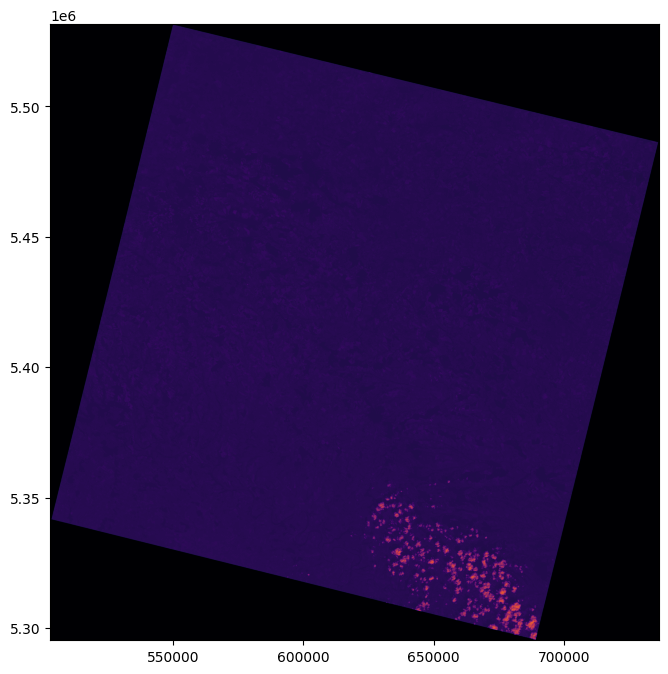

Image display PreparedData/LandsatPrepData/Landsat_B/output_RGB.TIF


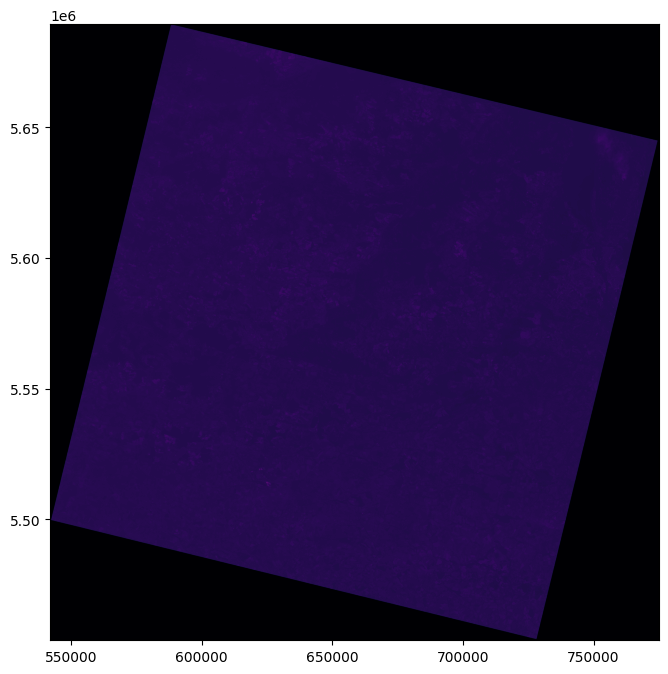

In [23]:
land_data.ShowTiffImgForPathList(land_data.GetRGBImagePathes())

Image display PreparedData/LandsatPrepData/Landsat_A/output_PANCHR.TIF


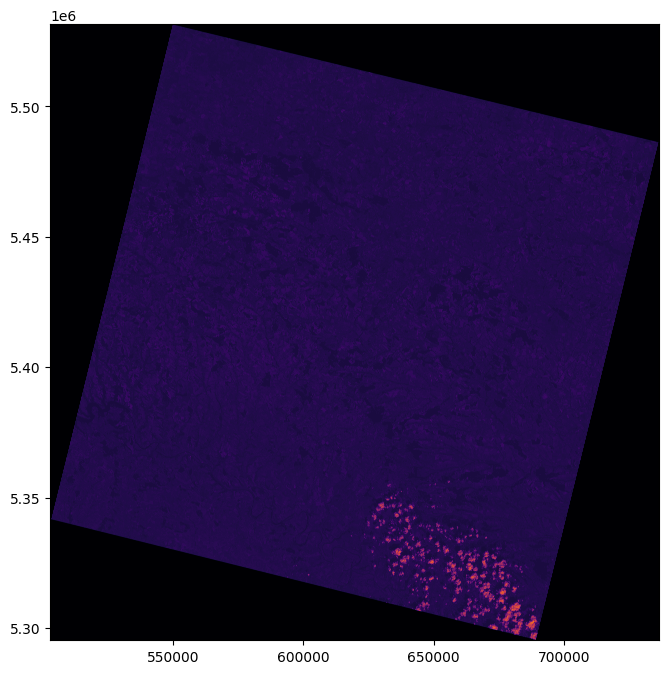

Image display PreparedData/LandsatPrepData/Landsat_B/output_PANCHR.TIF


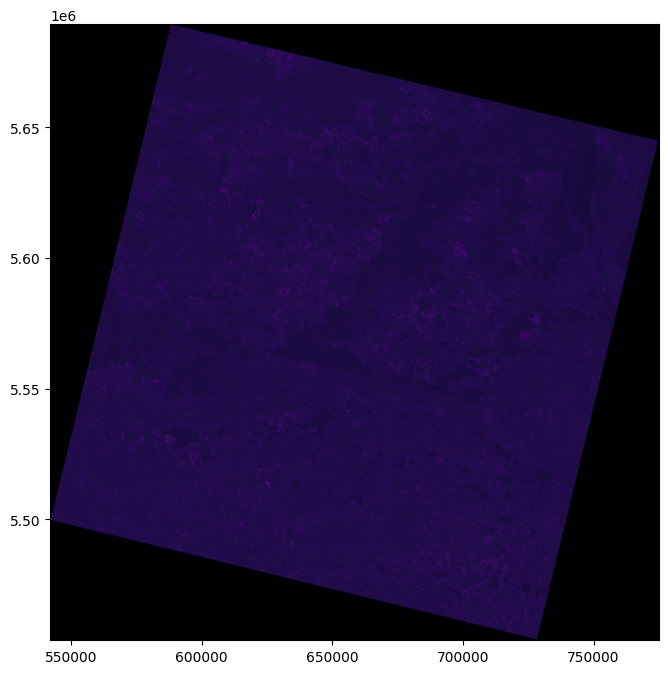

In [24]:
land_data.ShowTiffImgForPathList(land_data.GetPanchrImagePathes())

In [25]:
land_data.ReprojectInto4326()

Image display PreparedData/LandsatPrepData/Landsat_A/output_RGB_R4326.TIF


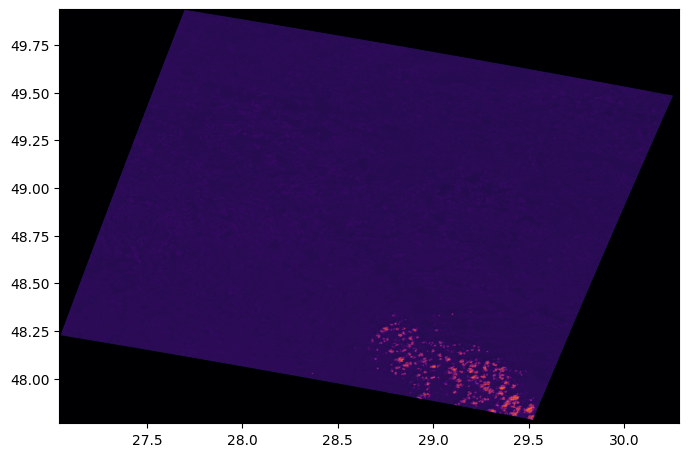

Image display PreparedData/LandsatPrepData/Landsat_B/output_RGB_R4326.TIF


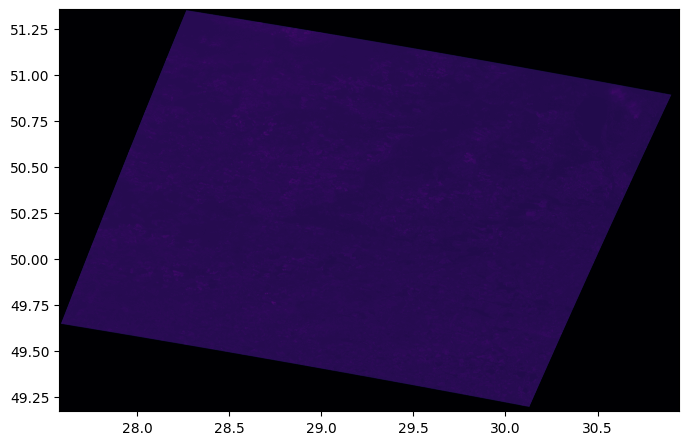

In [26]:
land_data.ShowTiffImgForPathList(land_data.GetReprojRGBImages())

Image display PreparedData/LandsatPrepData/Landsat_A/output_PANCHR_R4326.TIF


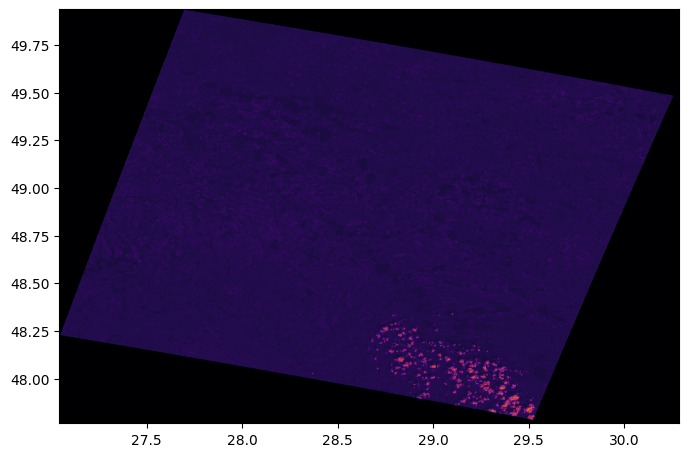

Image display PreparedData/LandsatPrepData/Landsat_B/output_PANCHR_R4326.TIF


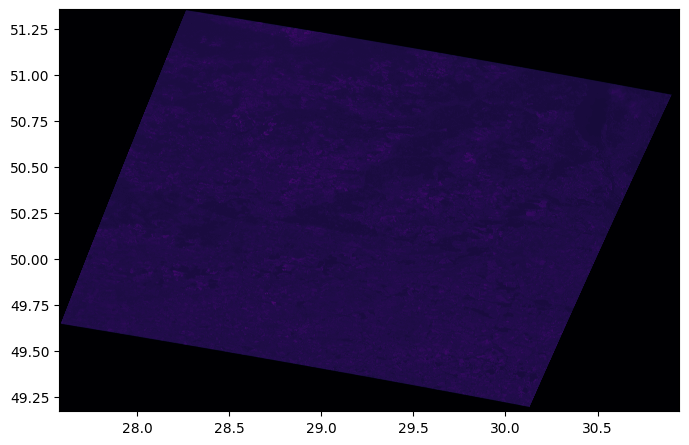

In [27]:
land_data.ShowTiffImgForPathList(land_data.GetReprojPanchrImages())

In [28]:
concat_r4326_rgb_path, concat_r4326_panchr_path = land_data.ConcatImagesR4326()

Image display PreparedData/LandsatPrepData/concat_R4326_output_RGB.tif


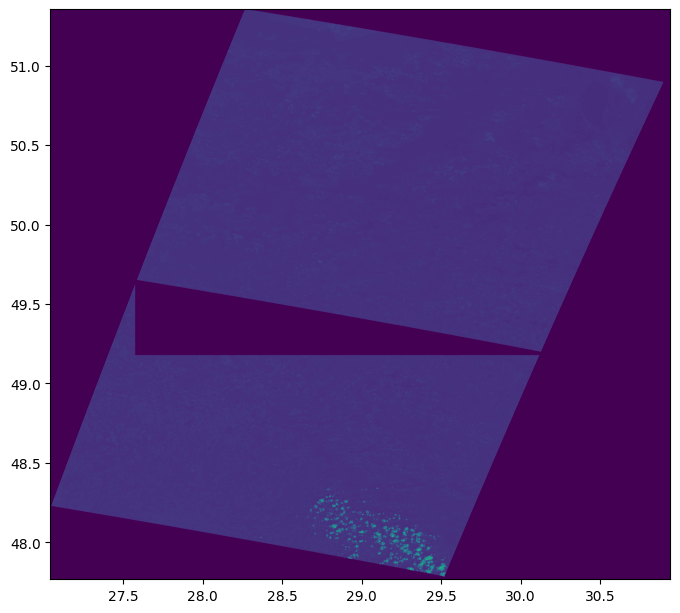

In [29]:
LandSatData.ShowImgForPath(concat_r4326_rgb_path)

Image display PreparedData/LandsatPrepData/concat_R4326_output_PANCHR.tif


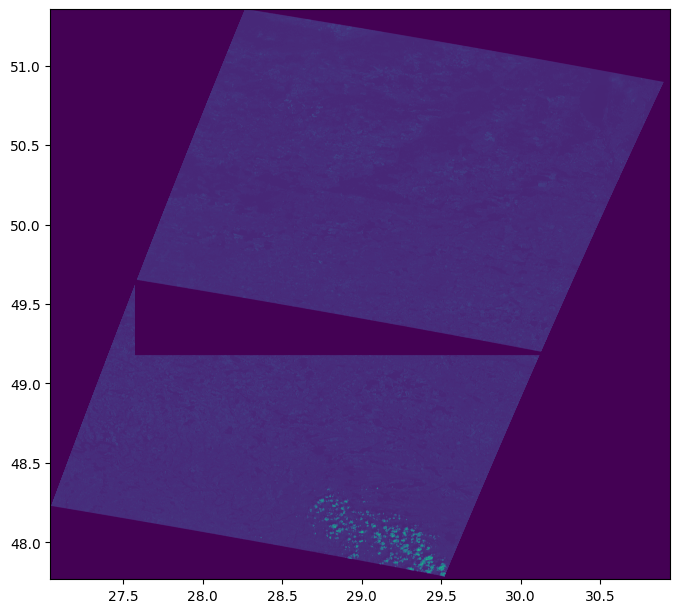

In [30]:
LandSatData.ShowImgForPath(concat_r4326_panchr_path)

In [31]:
crop_r4326_rgb_output_path = os.path.join(
    land_data.GetPrepDataDir(),
    'cropped_r4326_rgb_output.tif'
)

LandSatData.CutlineImg(
    concat_r4326_rgb_path,
    crop_r4326_rgb_output_path,
    shp_file_path
)

crop_r4326_panchr_output_path = os.path.join(
    land_data.GetPrepDataDir(),
    'cropped_r4326_panchr_output.tif'
)

LandSatData.CutlineImg(
    concat_r4326_panchr_path,
    crop_r4326_panchr_output_path,
    shp_file_path
)


Image display PreparedData/LandsatPrepData/cropped_r4326_rgb_output.tif


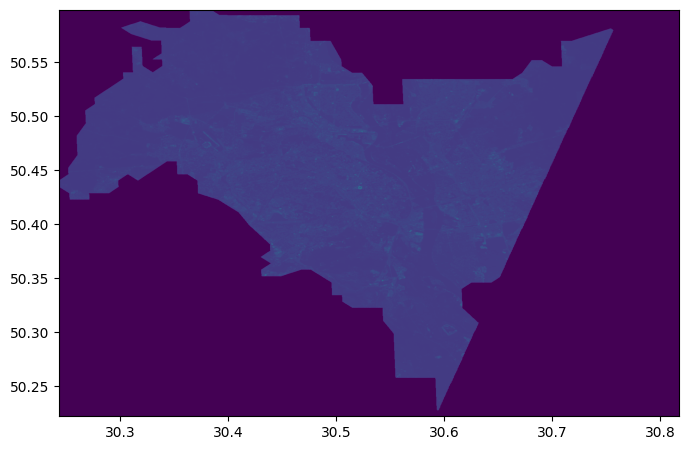

In [32]:
LandSatData.ShowImgForPath(crop_r4326_rgb_output_path)

Image display PreparedData/LandsatPrepData/cropped_r4326_panchr_output.tif


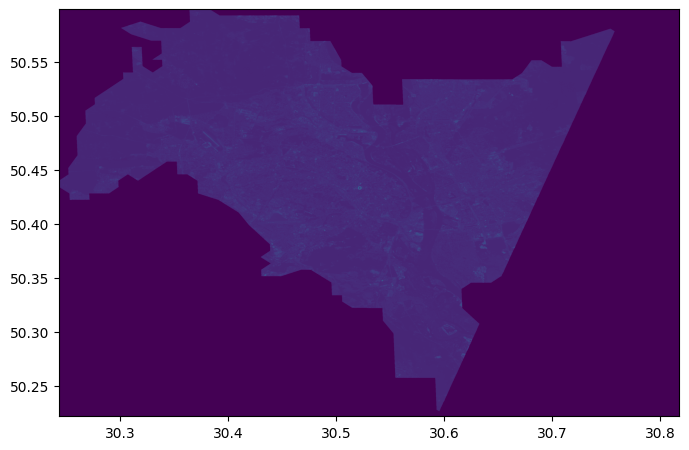

In [33]:
LandSatData.ShowImgForPath(crop_r4326_panchr_output_path)

In [34]:
concat_rgb_path, concat_panchr_path = land_data.ConcatImagesOrig()

Image display PreparedData/LandsatPrepData/concat_output_RGB.tif


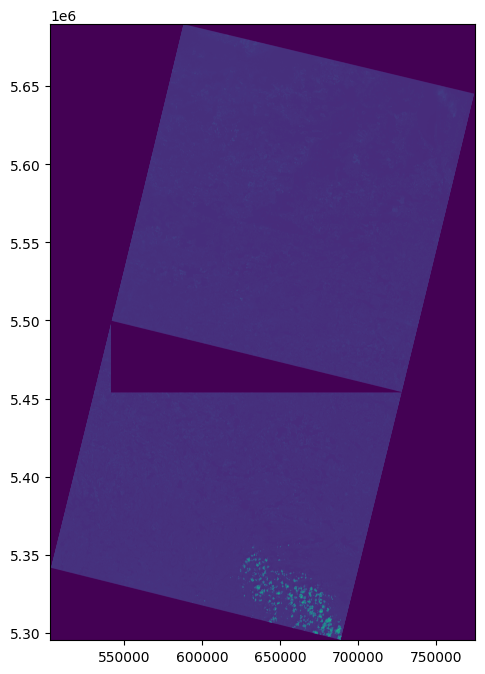

Image display PreparedData/LandsatPrepData/concat_output_PANCHR.tif


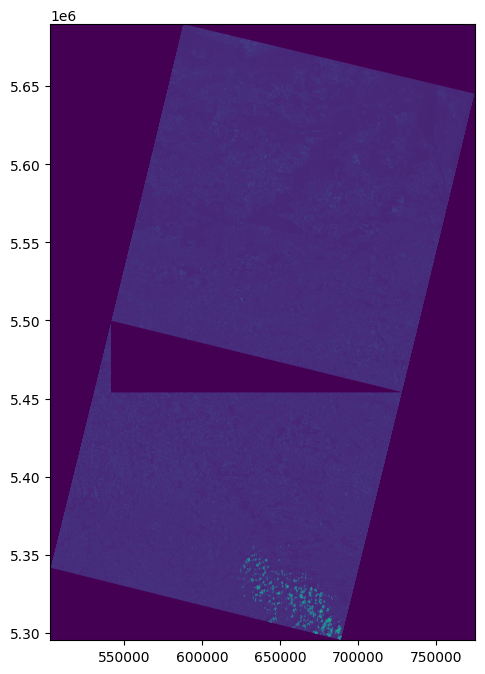

In [35]:
land_data.ShowImgForPath(concat_rgb_path)
land_data.ShowImgForPath(concat_panchr_path)

In [36]:
translated_rgb_60_output = os.path.join(
    land_data.GetPrepDataDir(),
    "translated_rgb_60_output.tif"
)

LandSatData.TranslateRGB(
    concat_rgb_path,
    translated_rgb_60_output
)


translated_panchr_30_output = os.path.join(
    land_data.GetPrepDataDir(),
    "translated_panchr_30_output.tif"
)

LandSatData.TranslatePanchr(
    concat_panchr_path,
    translated_panchr_30_output
)

Image display PreparedData/LandsatPrepData/translated_rgb_60_output.tif


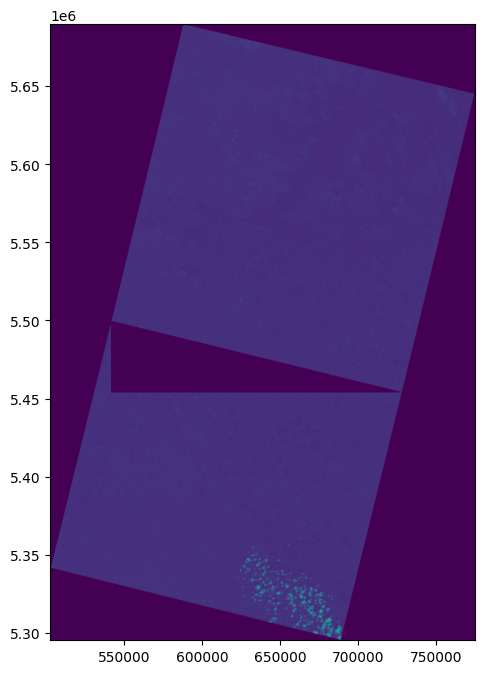

In [37]:
LandSatData.ShowImgForPath(translated_rgb_60_output)

Image display PreparedData/LandsatPrepData/translated_panchr_30_output.tif


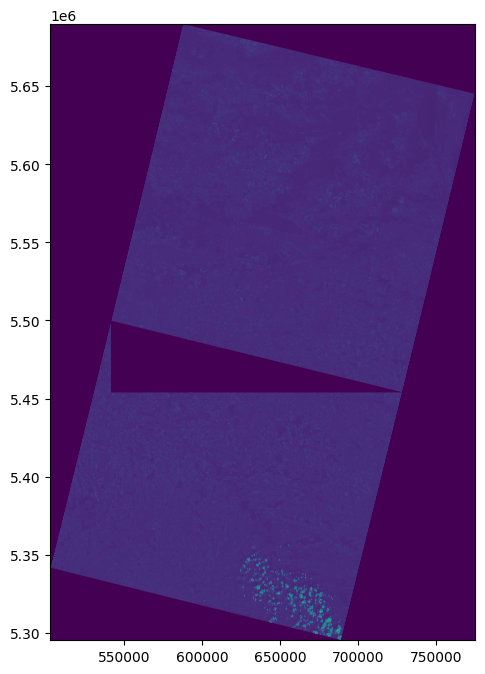

In [38]:
LandSatData.ShowImgForPath(translated_panchr_30_output)

In [39]:
pansharpened_images = LandSatData.Pansharpening(
    land_data.GetPrepDataDir(),
    translated_panchr_30_output,
    translated_rgb_60_output
)

Image display PreparedData/LandsatPrepData/pansharpen_output_average.tif


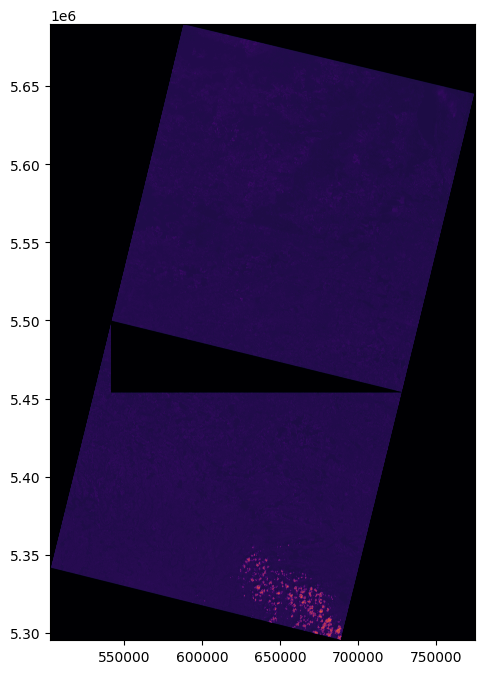

Image display PreparedData/LandsatPrepData/pansharpen_output_nearest.tif


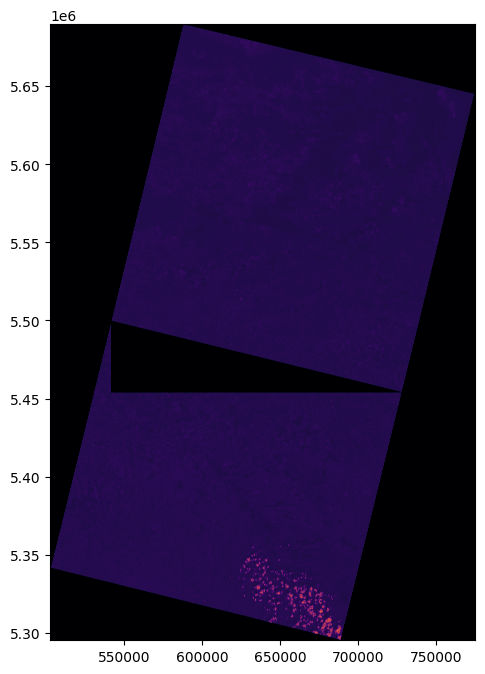

Image display PreparedData/LandsatPrepData/pansharpen_output_bilinear.tif


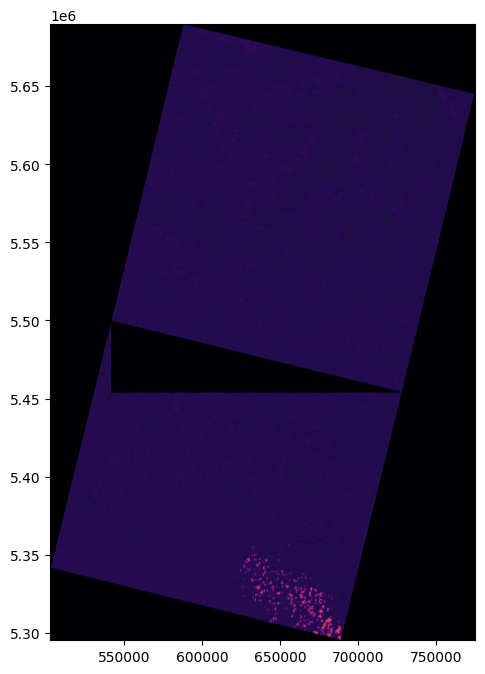

Image display PreparedData/LandsatPrepData/pansharpen_output_cubic.tif


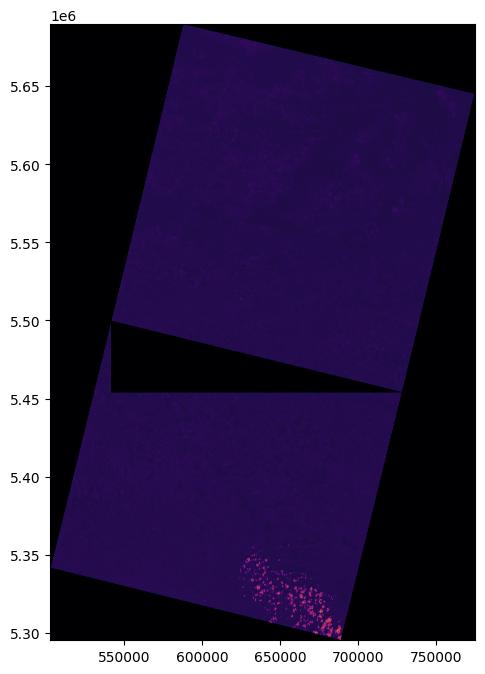

Image display PreparedData/LandsatPrepData/pansharpen_output_cubicspline.tif


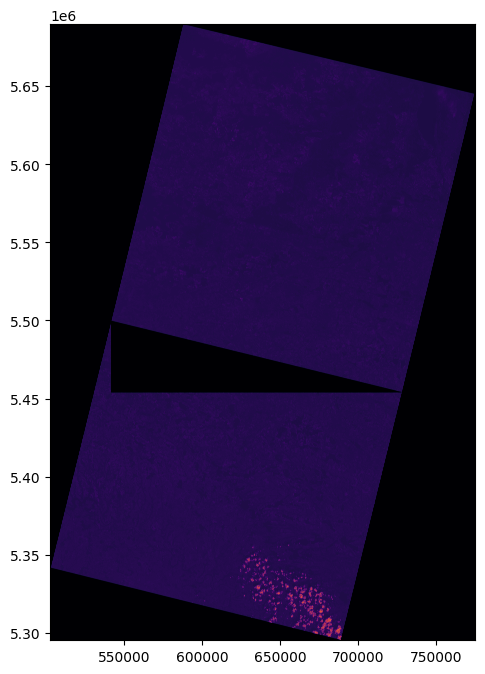

Image display PreparedData/LandsatPrepData/pansharpen_output_lanczos.tif


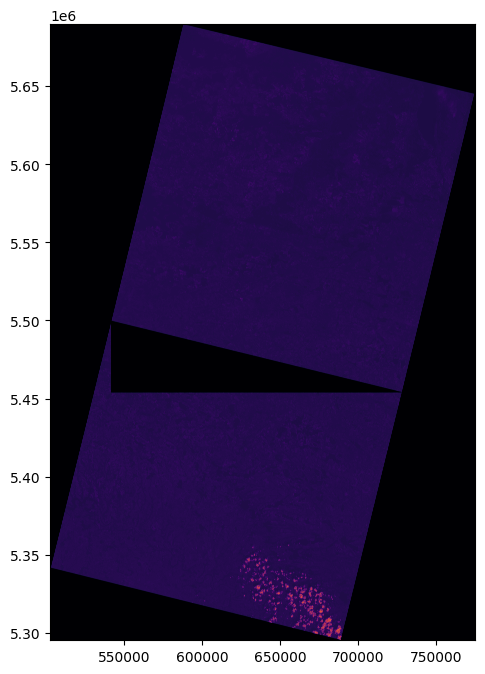

In [40]:
LandSatData.ShowTiffImgForPathList(pansharpened_images.values())

In [41]:
def CalcPanshAccurMetrics(panshap_images: dict, orig_image):
    orig_img_fd = rasterio.open(orig_image)
    orig_img_data = orig_img_fd.read()
    orig_img_fd.close()
    orig_img_flat = orig_img_data.flatten()

    cmp_results = {}
    
    for method, pansh_img_path in panshap_images.items():
        img_fd = rasterio.open(pansh_img_path)
        img_data = img_fd.read()
        img_fd.close()

        img_flat = img_data.flatten()

        try:
            print(f"{method} start")
            cmp_result = sklearn.metrics.r2_score(
                orig_img_flat,
                img_flat
            )
            print(f"{method} end")
        except Exception as e:
            print(e)
            continue

        cmp_results[method] = cmp_result
    
    return cmp_results



In [42]:
cmp_result = CalcPanshAccurMetrics(
    pansharpened_images,
    concat_rgb_path
)

for method, accuracy in cmp_result.items():
    print(f"{method} accuracy: {accuracy}")

nearest accuracy: 0.9987852528997122
bilinear accuracy: 0.9987718862407835
cubic accuracy: 0.9987742653680223
cubicspline accuracy: 0.9987806161095035
lanczos accuracy: 0.9987797522283988
average accuracy: 0.9987710903032676
